In [2]:
using Pkg; Pkg.activate("."); Pkg.instantiate()

using Zarr, Plots, Tables

  Activating project at `~/BGI/DeepCube/server_access`


## Naive access

Open connection to remote data cube (ESDC) and access three of its variables: GPP, LAI and TAIR.

In [5]:
g = zopen("https://s3.bgc-jena.mpg.de:9000/esdl-esdc-v2.1.1/esdc-8d-0.25deg-184x90x90-2.1.1.zarr", fill_as_missing=false)
gpp,nee,tair = g["gross_primary_productivity"],g["leaf_area_index"],g["air_temperature_2m"]

(ZArray{Float32} of size 1440 x 720 x 1840, ZArray{Float32} of size 1440 x 720 x 1840, ZArray{Float32} of size 1440 x 720 x 1840)

In [6]:
# get variables dimensions
nlon,nlat,ntime = size(gpp)
# set batch size (number of random samples)
batchsize = 20

20

In [7]:
# randomly choose locations
locs = [(rand(1:nlon),rand(1:nlat)) for _ in 1:batchsize]
# time range
tr = 1000:1732
# extract variables at random locations for the specifued time range
batchdata = map(locs) do l
    gpp[l[1],l[2],tr],nee[l[1],l[2],tr],tair[l[1],l[2],tr]
end;

In [8]:
typeof(batchdata)

Vector{Tuple{Vector{Float32}, Vector{Float32}, Vector{Float32}}} (alias for Array{Tuple{Array{Float32, 1}, Array{Float32, 1}, Array{Float32, 1}}, 1})

In [9]:
# batchdata is a vector of Tuples.
# Convert it to Array
alldata = [batchdata[ibatch][ivar][itime] for itime in 1:length(tr), ivar=1:3, ibatch=1:batchsize];

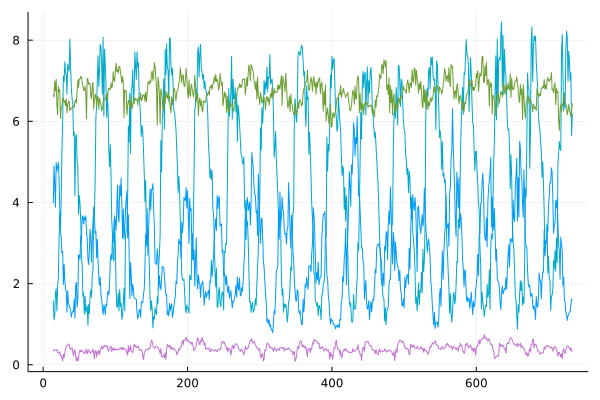

In [10]:
# plot GPP for all samples (that have data)
plot(alldata[:,1,:], label=false)

## With stream sampler

BatchShuffleServer gives an example of how to launch a server for the sampler from a Docker containor.

First we need to build the docker:

```bash
sudo docker build -t batchshuffler .
```

Then we launch the server with:
```bash
path_to_cube="https://s3.bgc-jena.mpg.de:9000/esdl-esdc-v2.1.1/esdc-8d-0.25deg-184x90x90-2.1.1.zarr"
vars_to_include="gross_primary,leaf_area,air_temperature"
start_year=2001
end_year=2016
repeats_per_collection=20
batchsize=2
nchunks=10
ip="0.0.0.0"
port=9052

docker run -p 9052:9052 batchshuffler $path_to_cube -v $vars_to_include -s $start_year -e $end_year -r $repeats_per_collection -b $batchsize -n $nchunks --ip $ip -p $port
```

In this case we sample the ESDC for three variables (GPP, LAI, TAIR) for years 2001 to 2016.
Each batch consits of 100 collections of 20 randomly sampled locations.
10 chunks are held in memory contemporarily.

The server runs at the specified IP address and port inside the container. The above instructions are saved in file launch_server.sh

```
sh server launch_server.sh
```


On Linux, the ip address of the server can be retrieved with:

```bash
sudo ip addr show docker0
```

On Mac, you first get the container id with `docker ps`, then retrieve the Gateway address with `docker inspect`.

Once the server is launched, it can be called with Zarr.zopen()

Without Docker on http://macadamia.bgc-jena.mpg.de:
```bash
path_to_cube="https://s3.bgc-jena.mpg.de:9000/esdl-esdc-v2.1.1/esdc-8d-0.25deg-184x90x90-2.1.1.zarr"
vars_to_include="gross_primary,leaf_area,air_temperature"
start_year=2001
end_year=2016
repeats_per_collection=10
batchsize=100
nchunks=10
ip="141.5.17.118"
port=9052

julia --project -e 'using Pkg; Pkg.add(url="https://github.com/meggart/DiskArrayShufflers.jl"); Pkg.resolve(); Pkg.precompile(); include("./launch_shuffler.jl")'\
 $path_to_cube -v $vars_to_include -s $start_year -e $end_year -r $repeats_per_collection -b $batchsize -n $nchunks --ip $ip -p $port
 ```

In [7]:
gsampled = zopen("http://127.0.0.1:9052",fill_as_missing=true)

ZarrGroup at Consolidated Zarr.HTTPStore("http://127.0.0.1:9052") and path 
Variables: batches 

The generated ZarrGroup has no dimensions and only one variable: batches, which is an array with time x var x collections.

In [8]:
gsampled["batches"]

ZArray{Float32} of size 736 x 3 x 10

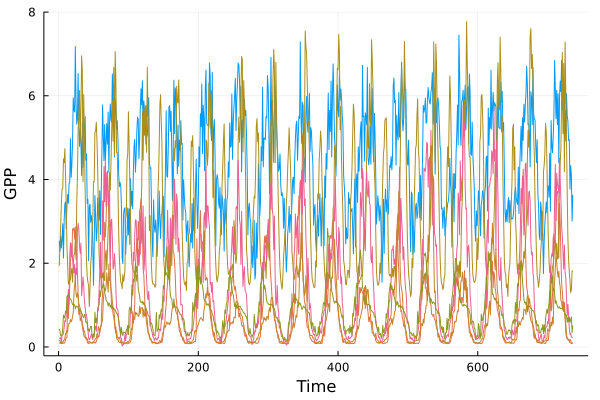

In [9]:
# plot GPP over time
plot(gsampled["batches"][:,1,:],label=false, xlabel="Time", ylabel="GPP")

Each call to gsampled gives back new samples.

## Use stream sampler to train a model

In [9]:
# function to get batch of samples with GPP as predicted variable and LAI and TAIR as predictors
function BatchStreamer(url::String,nbatch) 
    gsampled = zopen(url,fill_as_missing=false)
    function getbatch()
        batch = gsampled["batches"][:,:,:]
        y = Float32.(vec(batch[:,1,:]))'
        x = Float32.(reshape(permutedims(batch[:,2:end,:],(2,1,3)),2,length(y)))
        return y,x
    end
    Iterators.map(_->getbatch(),1:nbatch)
end



BatchStreamer (generic function with 1 method)

In [17]:

using Flux
# Define model as two inputs / one output with one hidden layer of 10 nodes.
model = Chain(
  Dense(2 => 10, σ),
  Dense(10 => 1),
)
# model parameters
p = Flux.params(model)

# set optimiser as classic gradient descent
opt = Descent(0.01)

Descent(0.01)

In [18]:
using Statistics
# discard missing values
function filterxy(y,x)
    goodinds = vec(all(!isnan,x,dims=1) .&& (!isnan).(y))
    y[1:1,goodinds],x[:,goodinds]
end
# MSE as loss function
function getloss(y,x)
    y,x = filterxy(y,x)
    res = model(x) 
    l = mean((res.-y).^2)
    println(l)
    @show mean(res), mean(y)
    l
end

getloss (generic function with 1 method)

In [38]:
# scatter plot of residuals and observations
function plotScatter(y,x)
    y,x = filterxy(y,x)
    res = model(x) 
    scatter(y',res', fmt=:png)#,xlim=(0,11),ylim=(-5,5))
end

plotScatter (generic function with 1 method)

In [19]:
# get 10 collections of 10 locations, i.e. 100 samples
y,x = first(BatchStreamer("http://macadamia.bgc-jena.mpg.de:9052",10))

(Float32[NaN NaN … NaN NaN], Float32[NaN NaN … 0.0 0.0; 297.50427 297.63367 … 283.46655 282.0652])

In [26]:
print("y is a ")
print(typeof(y))
print(" of size ")
print(size(y))
print("\n")

print("x is a ")
print(typeof(x))
print(" of size ")
print(size(x))
print("\n")

y is a LinearAlgebra.Adjoint{Float32, Vector{Float32}} of size (1, 73600)
x is a Matrix{Float32} of size (2, 73600)


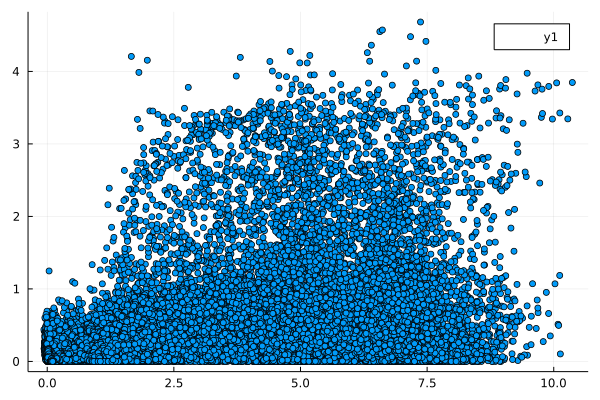

In [20]:
scatter(y',x[1,:], fmt=:png)

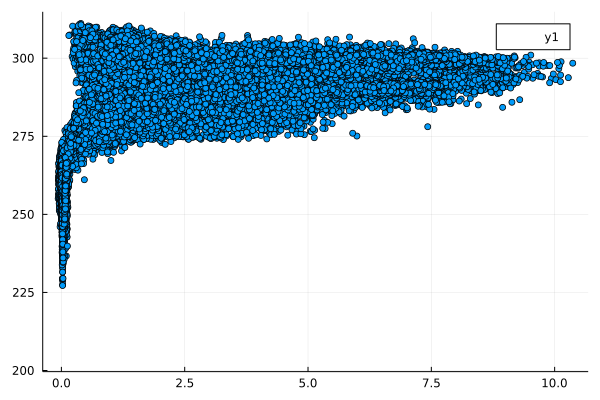

In [27]:
scatter(y',x[2,:], fmt=:png)

In [29]:
# train model on 10 batches
Flux.train!(getloss, p, BatchStreamer("http://macadamia.bgc-jena.mpg.de:9052",10), opt)

12.625304
(mean(res), mean(y)) = (2.247647f0, 5.0876136f0)
7.608911
(mean(res), mean(y)) = (2.5316432f0, 2.9970737f0)
9.947424
(mean(res), mean(y)) = (2.578189f0, 4.306092f0)
7.0699105
(mean(res), mean(y)) = (2.7509768f0, 2.9872699f0)
9.777013
(mean(res), mean(y)) = (2.774608f0, 3.9043992f0)
9.47202
(mean(res), mean(y)) = (2.8875868f0, 3.465871f0)
6.751313
(mean(res), mean(y)) = (2.945412f0, 3.5330572f0)
7.848001
(mean(res), mean(y)) = (3.0041776f0, 3.516669f0)
6.9319367
(mean(res), mean(y)) = (3.0554278f0, 2.4497972f0)
6.3906116
(mean(res), mean(y)) = (2.994865f0, 2.6944056f0)


In [35]:
Flux.params(model[2])

Params([Float32[0.4149758 0.23287891 … 0.5008054 0.4410335], Float32[0.29226425]])

In [31]:
model

Chain(
  Dense(2 => 10, σ),                    # 30 parameters
  Dense(10 => 1),                       # 11 parameters
)                   # Total: 4 arrays, 41 parameters, 420 bytes.

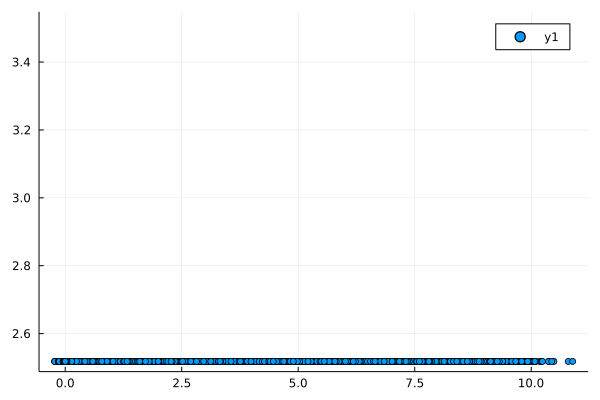

In [39]:
plotScatter(first(BatchStreamer("http://macadamia.bgc-jena.mpg.de:9052",10))...)

In [33]:
# train model on 100 samples
Flux.train!(getloss, p, BatchStreamer("http://macadamia.bgc-jena.mpg.de:9052",100), opt)

8.063319
(mean(res), mean(y)) = (2.9648185f0, 3.3308277f0)
7.48819
(mean(res), mean(y)) = (3.0014193f0, 3.6971886f0)
8.040069
(mean(res), mean(y)) = (3.0709982f0, 3.003606f0)
5.741522
(mean(res), mean(y)) = (3.0642576f0, 2.75811f0)
6.211013
(mean(res), mean(y)) = (3.0336428f0, 2.4434333f0)
8.311995
(mean(res), mean(y)) = (2.9746215f0, 3.4675431f0)
6.7136807
(mean(res), mean(y)) = (3.023914f0, 1.9727798f0)
6.0001597
(mean(res), mean(y)) = (2.918801f0, 1.7511019f0)
6.099802
(mean(res), mean(y)) = (2.802031f0, 1.7105801f0)
5.758295
(mean(res), mean(y)) = (2.6928856f0, 1.6441602f0)
5.9922214
(mean(res), mean(y)) = (2.5880141f0, 2.498578f0)
5.9854646
(mean(res), mean(y)) = (2.5790708f0, 2.4096797f0)
6.0841713
(mean(res), mean(y)) = (2.5621305f0, 1.7869829f0)
5.241892
(mean(res), mean(y)) = (2.4846156f0, 1.5944873f0)
5.65898
(mean(res), mean(y)) = (2.3956037f0, 2.1737163f0)
4.505672
(mean(res), mean(y)) = (2.3734143f0, 1.0283238f0)
6.013065
(mean(res), mean(y)) = (2.2389052f0, 2.3611643f0)
6

In [34]:
# train model on another 100 samples
Flux.train!(getloss, p, BatchStreamer("http://macadamia.bgc-jena.mpg.de:9052",100), opt)

6.1615434
(mean(res), mean(y)) = (2.692608f0, 2.8119678f0)
7.4522123
(mean(res), mean(y)) = (2.7045443f0, 3.1803744f0)
5.057824
(mean(res), mean(y)) = (2.7521257f0, 2.2459073f0)
6.115628
(mean(res), mean(y)) = (2.7015054f0, 3.2271495f0)
7.0584655
(mean(res), mean(y)) = (2.7540696f0, 3.0777328f0)
5.0023856
(mean(res), mean(y)) = (2.786435f0, 2.2246268f0)
10.428729
(mean(res), mean(y)) = (2.7302544f0, 4.766625f0)
8.892707
(mean(res), mean(y)) = (2.9338906f0, 4.520155f0)
9.829373
(mean(res), mean(y)) = (3.0925183f0, 4.556834f0)
9.323295
(mean(res), mean(y)) = (3.2389512f0, 4.5489087f0)
7.0382347
(mean(res), mean(y)) = (3.369947f0, 4.2558904f0)
7.8764153
(mean(res), mean(y)) = (3.4585392f0, 3.9974473f0)
7.0423837
(mean(res), mean(y)) = (3.5124314f0, 3.639278f0)
7.1706944
(mean(res), mean(y)) = (3.5251157f0, 4.172754f0)
6.3541265
(mean(res), mean(y)) = (3.5898798f0, 4.362179f0)
7.0102677
(mean(res), mean(y)) = (3.6671069f0, 4.68648f0)
9.366297
(mean(res), mean(y)) = (3.7690449f0, 2.1269116f

In [16]:
# test model on another batch (no guarantee that samples are different from 1 batch to another)
